<a href="https://colab.research.google.com/github/ZeroJoon2/DeepLearning/blob/main/8_1_CNN_cifar10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

캐나다 토론토 대학교에서 제작한 데이터셋
제프리 힌턴에 데이터셋 제작에 참여
구성 : 32 x 32 x 3의 컬러이미지 데이터 - 총 60000개의 이미지
50000개의 트레이닝용 이미지
10000개의 검증용 이미지
10개의 데이터 종류별로 6000개의 이미지


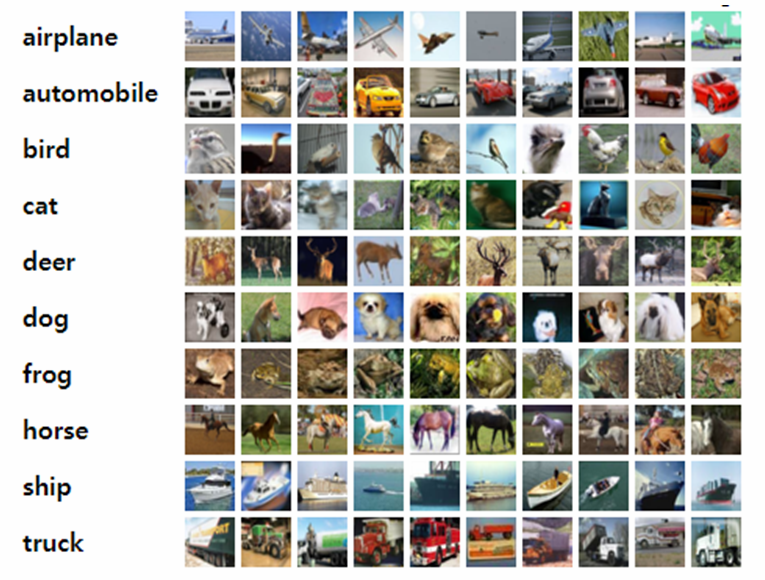

In [1]:
from tensorflow import keras
from tensorflow.keras import layers

from tensorflow.keras.datasets import cifar10
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import load_model
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Activation
from sklearn.metrics import classification_report

In [2]:
((trainX, trainY), (testX, testY)) = cifar10.load_data()
trainX = trainX.astype("float")/255
testX = testX.astype("float")/255

In [3]:
lb = LabelBinarizer()

trainY = lb.fit_transform(trainY)
testY = lb.fit_transform(testY)

In [4]:
labelNames = ["airplane", "automobile", "bird", "cat", "deer",
	"dog", "frog", "horse", "ship", "truck"]

In [5]:
opt = SGD(learning_rate=0.01)

height = 32
width = 32
depth =3

model = Sequential()
inputShape = (height, width, depth)

if K.image_data_format() == "channels_first":
	inputShape = (depth, height, width)



In [6]:
# 모델의 구성
inputs = keras.Input(shape = (32,32,3))

x = layers.Conv2D(filters = 32
                  , kernel_size = 3
                  , activation = 'relu'
                  )(inputs)

x = layers.MaxPooling2D(
                  pool_size = 2
                  )(x)

x = layers.Conv2D(filters = 64
                  , kernel_size = 3
                  , activation = 'relu'
                  )(x)

x = layers.MaxPooling2D(
                  pool_size = 2
                  )(x)

x = layers.Conv2D(filters = 128
                  , kernel_size = 3
                  , activation = 'relu'
                  )(x)

x = layers.Flatten()(x)

outputs = layers.Dense(10, activation = 'softmax')(x)
model = keras.Model(inputs = inputs, outputs = outputs)


In [7]:
# 모델 설정
model.compile(optimizer = opt
              , loss = 'categorical_crossentropy'
              , metrics = ['accuracy'])


In [8]:
# 모델 훈련
history = model.fit(trainX, trainY
                    , validation_data = (testX, testY)
                    , batch_size = 32
                    , epochs = 20
                    , verbose = True
                    )

Epoch 1/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.1845 - loss: 2.1753 - val_accuracy: 0.3143 - val_loss: 1.9019
Epoch 2/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.3527 - loss: 1.8064 - val_accuracy: 0.4365 - val_loss: 1.5713
Epoch 3/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.4469 - loss: 1.5450 - val_accuracy: 0.4753 - val_loss: 1.4941
Epoch 4/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.5022 - loss: 1.4000 - val_accuracy: 0.5025 - val_loss: 1.3995
Epoch 5/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.5396 - loss: 1.2935 - val_accuracy: 0.5606 - val_loss: 1.2364
Epoch 6/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.5751 - loss: 1.2063 - val_accuracy: 0.5623 - val_loss: 1.2360
Epoch 7/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.6008 - loss: 1.1417 - val_accuracy: 0.5838 - val_loss: 1.1595
Epoch 8/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.6269 - loss: 1.0798 - 

In [9]:
# 모델 예측
predictions = model.predict(testX, batch_size = 32)
predictions

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


array([[1.0504808e-02, 8.5216481e-04, 6.0252115e-02, ..., 2.6723929e-04,
        5.4603107e-03, 2.1121705e-04],
       [1.6697748e-02, 1.8592489e-01, 2.1655159e-08, ..., 3.7166036e-08,
        7.9450333e-01, 2.8738666e-03],
       [1.8763338e-01, 6.6148512e-02, 1.2735630e-03, ..., 9.5412979e-04,
        7.0647818e-01, 3.5709187e-02],
       ...,
       [4.7980549e-05, 1.6877215e-05, 7.8567170e-02, ..., 3.7088651e-02,
        8.3493593e-05, 5.2683263e-05],
       [2.2056444e-01, 2.3051073e-01, 6.0487273e-03, ..., 1.7072743e-02,
        1.6661505e-04, 5.6993734e-04],
       [1.5562861e-06, 2.6325629e-06, 1.4368154e-04, ..., 9.8763418e-01,
        6.5136867e-08, 1.5549745e-06]], dtype=float32)

In [10]:
# 추론파일 저장
classification_report(testY.argmax(axis = 1)
                    , predictions.argmax(axis = 1)
                    , target_names=labelNames
                      )

'              precision    recall  f1-score   support\n\n    airplane       0.65      0.81      0.72      1000\n  automobile       0.82      0.79      0.81      1000\n        bird       0.62      0.58      0.60      1000\n         cat       0.51      0.54      0.52      1000\n        deer       0.72      0.54      0.62      1000\n         dog       0.62      0.56      0.59      1000\n        frog       0.71      0.84      0.77      1000\n       horse       0.75      0.73      0.74      1000\n        ship       0.84      0.76      0.80      1000\n       truck       0.76      0.80      0.78      1000\n\n    accuracy                           0.70     10000\n   macro avg       0.70      0.70      0.69     10000\nweighted avg       0.70      0.70      0.69     10000\n'

In [11]:
model.save('cifar10_cnn_model.keras')
loaded_model = load_model('cifar10_cnn_model.keras')

loaded_predictions = loaded_model.predict(testX, batch_size = 32)

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


In [14]:
loaded_model.evaluate(testX, testY)

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6997 - loss: 0.8793


[0.8914439678192139, 0.6958000063896179]

In [12]:
print(classification_report(testY.argmax(axis=1)
      , loaded_predictions.argmax(axis=1)
      , target_names=labelNames)
    )

              precision    recall  f1-score   support

    airplane       0.65      0.81      0.72      1000
  automobile       0.82      0.79      0.81      1000
        bird       0.62      0.58      0.60      1000
         cat       0.51      0.54      0.52      1000
        deer       0.72      0.54      0.62      1000
         dog       0.62      0.56      0.59      1000
        frog       0.71      0.84      0.77      1000
       horse       0.75      0.73      0.74      1000
        ship       0.84      0.76      0.80      1000
       truck       0.76      0.80      0.78      1000

    accuracy                           0.70     10000
   macro avg       0.70      0.70      0.69     10000
weighted avg       0.70      0.70      0.69     10000



### 추론

['./test_image/0.jpg',
 './test_image/1.jpg',
 './test_image/2.jpg',
 './test_image/3.jpg',
 './test_image/4.jpg',
 './test_image/5.jpg',
 './test_image/6.jpg',
 './test_image/7.jpg',
 './test_image/8.jpg',
 './test_image/9.jpg']

In [31]:
['./test_image/'+str(i)+'.jpg' for i in range(0,10)]

['./test_image/0.jpg',
 './test_image/1.jpg',
 './test_image/2.jpg',
 './test_image/3.jpg',
 './test_image/4.jpg',
 './test_image/5.jpg',
 './test_image/6.jpg',
 './test_image/7.jpg',
 './test_image/8.jpg',
 './test_image/9.jpg']

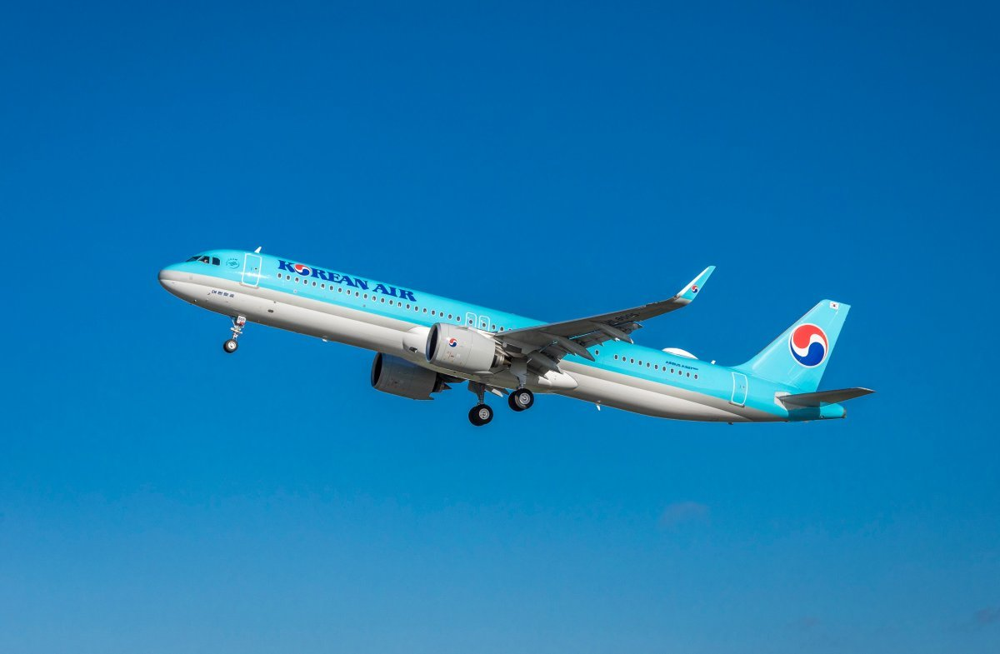

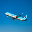

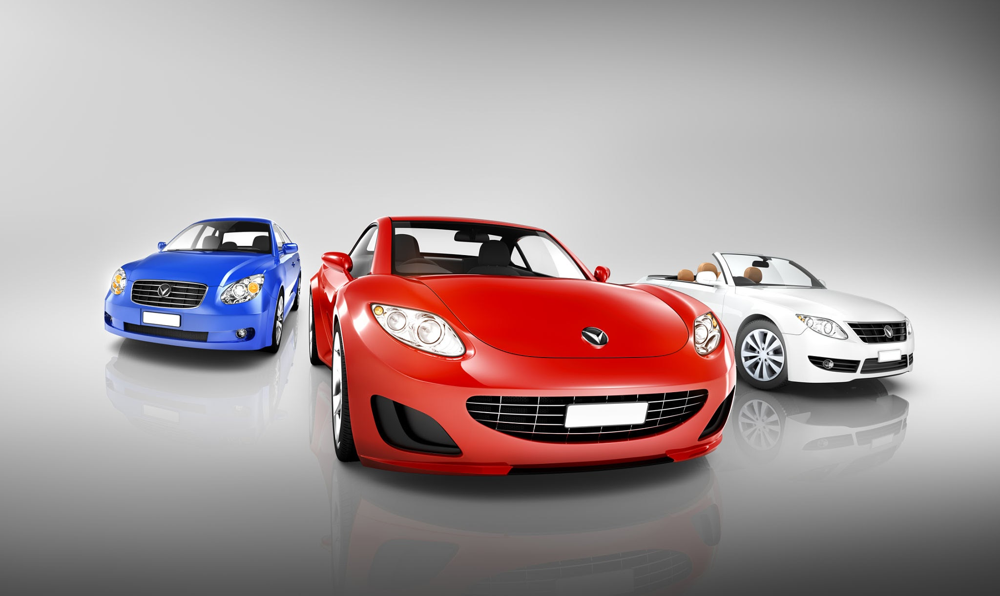

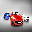

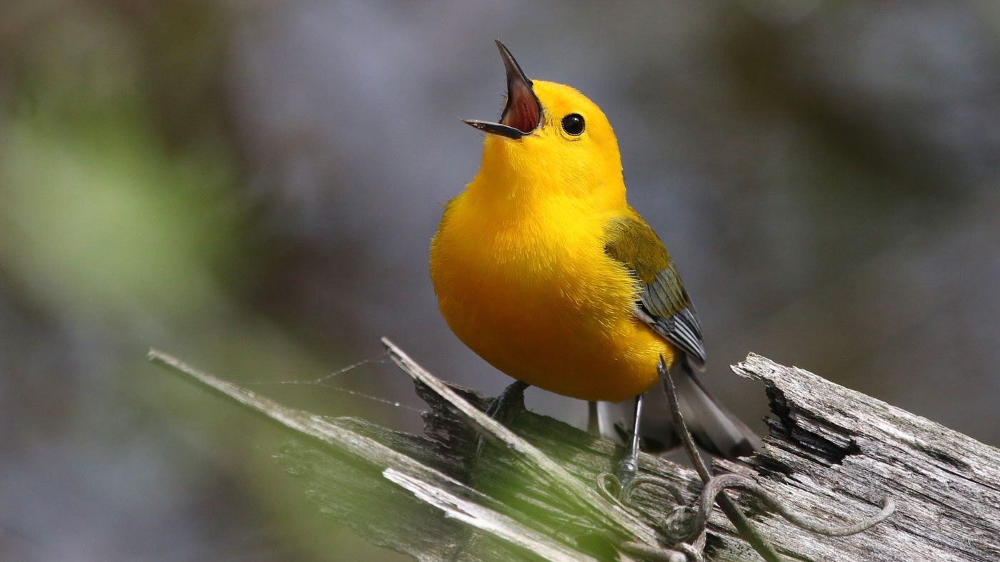

...

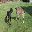

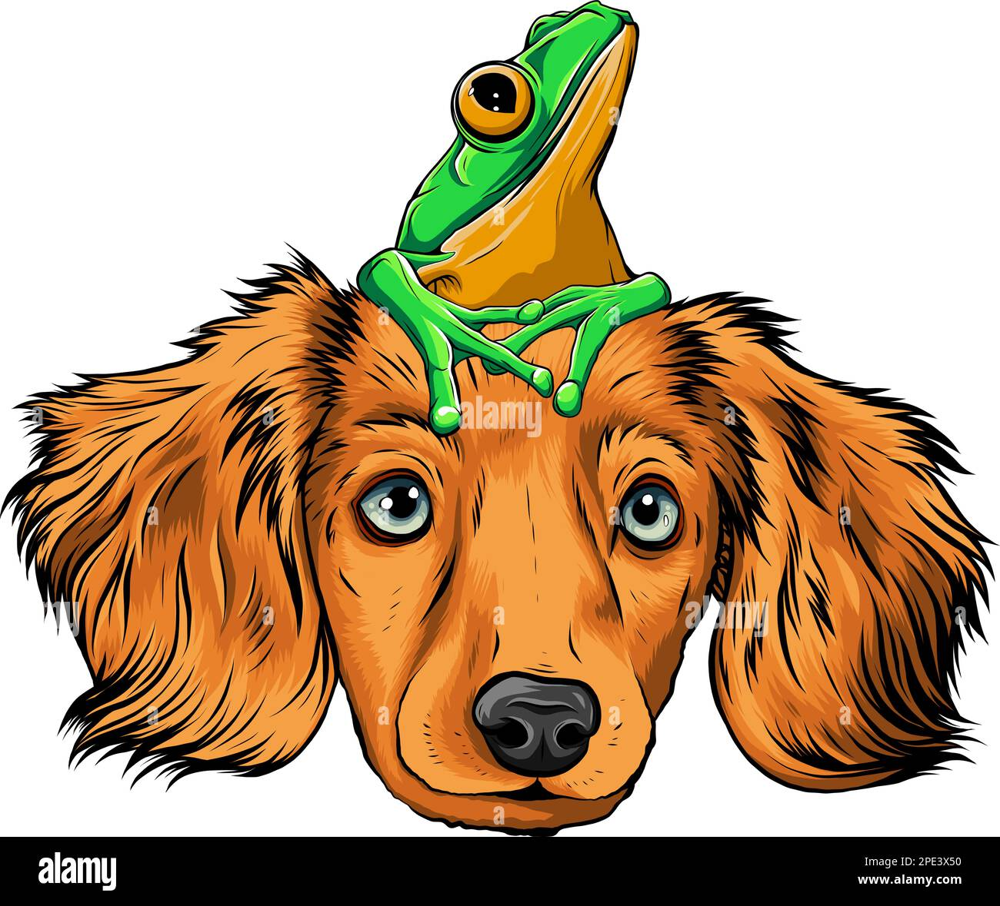

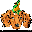

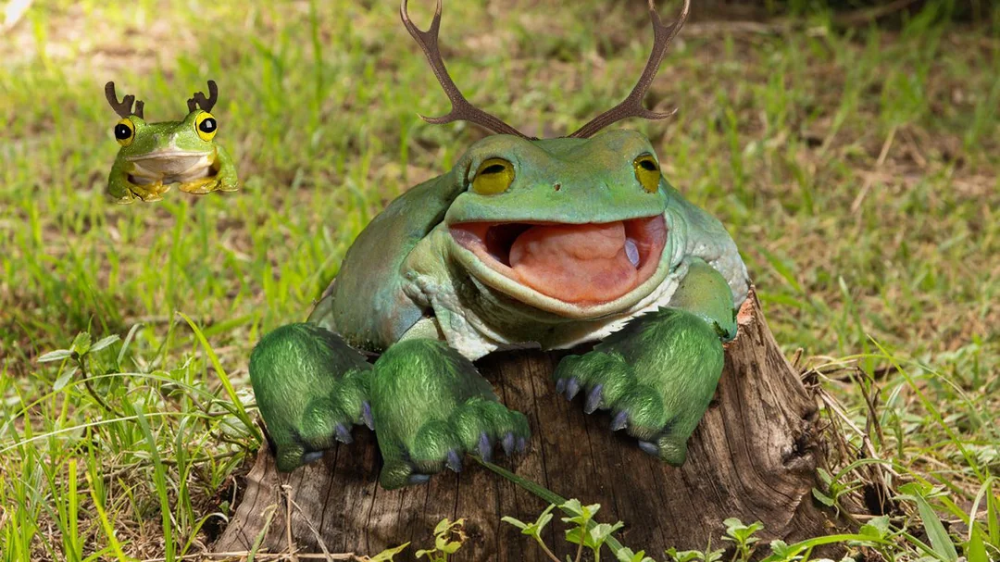

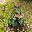

Error: Could not load image at path: ./test_image/7.jpg


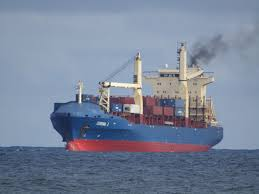

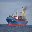

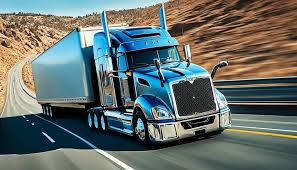

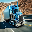

[0, 1, 2, 3, 6, 9, 6, 0, 9]


In [32]:
from tensorflow.keras.models import load_model  # TensorFlow is required for Keras to work
import cv2  # Install opencv-python
import numpy as np
from google.colab.patches import cv2_imshow

predictions_list = []
for i in ['./test_image/'+str(i)+'.jpg' for i in range(0,10)]:
    # 내가 판단할 이미지를 로드 OpenCV로 한다.
    img = cv2.imread(i)
    # Check if image was loaded successfully
    if img is None:
        print(f"Error: Could not load image at path: {i}")
        continue  # Skip to the next image
    cv2_imshow(img)
    cv2.waitKey(2000)
    cv2.destroyAllWindows()
    img_resized = cv2.resize(img, (32,32))
    cv2_imshow(img_resized)
    cv2.waitKey(2000)
    cv2.destroyAllWindows()


    img_norm = img_resized.astype('float')/255.0
    X = np.asarray([img_norm])

    predictions = loaded_model(X, training=False)
    predictions_list.append(np.argmax(predictions))

print(predictions_list)




### 모델 개선

Epoch 1/20
   1/1563 ━━━━━━━━━━━━━━━━━━━━ 5:50 224ms/step - accuracy: 0.7188 - loss: 0.8406

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1563/1563 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - accuracy: 0.6588 - loss: 0.9811 - val_accuracy: 0.6878 - val_loss: 0.9120
Epoch 2/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 40s 20ms/step - accuracy: 0.6709 - loss: 0.9486 - val_accuracy: 0.7121 - val_loss: 0.8555
Epoch 3/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - accuracy: 0.6718 - loss: 0.9400 - val_accuracy: 0.7122 - val_loss: 0.8429
Epoch 4/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 30s 19ms/step - accuracy: 0.6765 - loss: 0.9178 - val_accuracy: 0.7161 - val_loss: 0.8422
Epoch 5/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 30s 19ms/step - accuracy: 0.6840 - loss: 0.9113 - val_accuracy: 0.7170 - val_loss: 0.8362
Epoch 6/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - accuracy: 0.6927 - loss: 0.8834 - val_accuracy: 0.6860 - val_loss: 0.9384
Epoch 7/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 43s 21ms/step - accuracy: 0.6927 - loss: 0.8915 - val_accuracy: 0.7132 - val_loss: 0.8522
Epoch 8/20
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - accuracy: 0.6957 - loss: 0.87

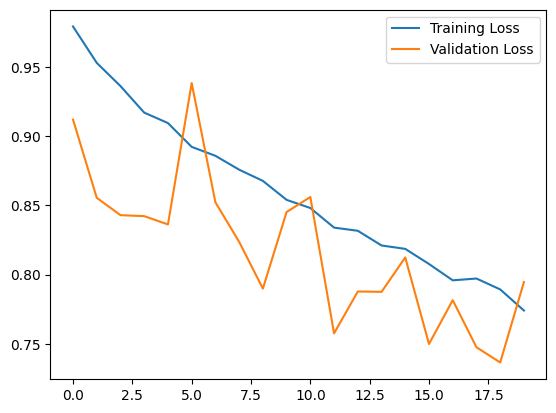

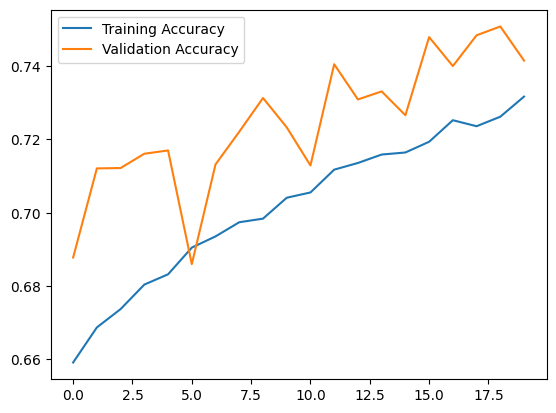

In [13]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=15,       # 이미지 회전
    width_shift_range=0.1,   # 가로 이동
    height_shift_range=0.1,  # 세로 이동
    horizontal_flip=True     # 좌우 반전
)

datagen.fit(trainX)

# 데이터 증강을 적용하여 학습
history = model.fit(datagen.flow(trainX, trainY, batch_size=32),
                    validation_data=(testX, testY),
                    epochs=20)
x = layers.Conv2D(filters=32, kernel_size=3, activation='relu')(inputs)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Dropout(0.3)(x)  # 드롭아웃 추가

x = layers.Conv2D(filters=64, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Dropout(0.3)(x)

x = layers.Conv2D(filters=128, kernel_size=3, activation='relu')(x)
x = layers.Flatten()(x)
x = layers.Dropout(0.4)(x)  # 드롭아웃 추가

outputs = layers.Dense(10, activation='softmax')(x)
model = keras.Model(inputs=inputs, outputs=outputs)
x = layers.Conv2D(filters=32, kernel_size=3)(inputs)
x = layers.BatchNormalization()(x)  # 배치 정규화 추가
x = layers.Activation('relu')(x)
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import LearningRateScheduler

def lr_schedule(epoch):
    initial_lr = 0.01
    if epoch > 10:
        return initial_lr * 0.1
    return initial_lr

opt = SGD(learning_rate=0.01, momentum=0.9)
lr_scheduler = LearningRateScheduler(lr_schedule)

model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(trainX, trainY, epochs=20, validation_data=(testX, testY), callbacks=[lr_scheduler])
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_weights = compute_class_weight(
    'balanced',
    classes=np.unique(trainY.argmax(axis=1)),
    y=trainY.argmax(axis=1)
)

class_weights_dict = dict(enumerate(class_weights))
print(class_weights_dict)

# 모델 학습 시 클래스 가중치 적용
model.fit(trainX, trainY, epochs=20, validation_data=(testX, testY), class_weight=class_weights_dict)
from tensorflow.keras.applications import ResNet50

base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(32, 32, 3))
x = base_model.output
x = layers.Flatten()(x)
x = layers.Dense(64, activation='relu')(x)
outputs = layers.Dense(10, activation='softmax')(x)

model = keras.Model(inputs=base_model.input, outputs=outputs)

# 사전 학습된 레이어를 동결
for layer in base_model.layers:
    layer.trainable = False

# 모델 컴파일 및 학습
model.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(trainX, trainY, epochs=20, validation_data=(testX, testY))
import matplotlib.pyplot as plt

# 학습 및 검증 손실 시각화
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

# 학습 및 검증 정확도 시각화
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.show()


313/313 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1000
           1       0.00      0.00      0.00      1000
           2       0.00      0.00      0.00      1000
           3       0.00      0.00      0.00      1000
           4       0.10      1.00      0.18      1000
           5       0.00      0.00      0.00      1000
           6       0.00      0.00      0.00      1000
           7       0.00      0.00      0.00      1000
           8       0.00      0.00      0.00      1000
           9       0.00      0.00      0.00      1000

    accuracy                           0.10     10000
   macro avg       0.01      0.10      0.02     10000
weighted avg       0.01      0.10      0.02     10000



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
